In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objs as go #visualization library
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf #autocorrelation test
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller #stationarity test
from statsmodels.tsa.statespace.sarimax import SARIMAX 
from datetime import datetime, timedelta
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from xgboost import XGBRegressor
from scipy import stats
import holidays
import warnings
warnings.filterwarnings("ignore")

import os

import math
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import *
from keras.callbacks import EarlyStopping

Using TensorFlow backend.


In [2]:
years=[2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015]
lst=[]
for date in holidays.UnitedStates(years=years).items():
    print(str(date[0]))
    lst.append(str(date[0]))

2005-01-01
2004-12-31
2005-01-17
2005-02-21
2005-05-30
2005-07-04
2005-09-05
2005-10-10
2005-11-11
2005-11-24
2005-12-25
2005-12-26
2006-01-01
2006-01-02
2006-01-16
2006-02-20
2006-05-29
2006-07-04
2006-09-04
2006-10-09
2006-11-11
2006-11-10
2006-11-23
2006-12-25
2007-01-01
2007-01-15
2007-02-19
2007-05-28
2007-07-04
2007-09-03
2007-10-08
2007-11-11
2007-11-12
2007-11-22
2007-12-25
2008-01-01
2008-01-21
2008-02-18
2008-05-26
2008-07-04
2008-09-01
2008-10-13
2008-11-11
2008-11-27
2008-12-25
2009-01-01
2009-01-19
2009-02-16
2009-05-25
2009-07-04
2009-07-03
2009-09-07
2009-10-12
2009-11-11
2009-11-26
2009-12-25
2010-01-01
2010-12-31
2010-01-18
2010-02-15
2010-05-31
2010-07-04
2010-07-05
2010-09-06
2010-10-11
2010-11-11
2010-11-25
2010-12-25
2010-12-24
2011-01-01
2011-01-17
2011-02-21
2011-05-30
2011-07-04
2011-09-05
2011-10-10
2011-11-11
2011-11-24
2011-12-25
2011-12-26
2012-01-01
2012-01-02
2012-01-16
2012-02-20
2012-05-28
2012-07-04
2012-09-03
2012-10-08
2012-11-11
2012-11-12
2012-11-22

In [3]:
d=pd.DataFrame(lst)
d=d.astype(str)
d[0] = d[0].astype('datetime64[ns]')

In [4]:
data=pd.read_csv('C:\\Users\\verma\\Downloads\\data2.csv')

In [5]:
data2=data
data2.head()

,Unnamed: 0,Pickup_Date,Number of Trips,Number of Vehicles
0,0,2005-01-01,26,17
1,1,2005-01-02,45,24
2,2,2005-01-03,731,36
3,3,2005-01-04,10,9
4,4,2005-01-05,814,62


In [6]:
data2['holiday']=[1500 if str(val).split()[0] in lst else 0 for val in data2['Pickup_Date']]

In [7]:
data2

,Unnamed: 0,Pickup_Date,Number of Trips,Number of Vehicles,holiday
0,0,2005-01-01,26,17,1500
1,1,2005-01-02,45,24,0
2,2,2005-01-03,731,36,0
3,3,2005-01-04,10,9,0
4,4,2005-01-05,814,62,0
...,...,...,...,...,...
4012,4012,2015-12-27,20,12,0
4013,4013,2015-12-28,278,29,0
4014,4014,2015-12-29,1,1,0
4015,4015,2015-12-30,290,95,0


In [222]:
dataset_2=pd.read_csv('C:\\Users\\verma\\Downloads\\dataset2.csv')

In [9]:
data.isnull().sum()

Unnamed: 0            0
Pickup_Date           0
Number of Trips       0
Number of Vehicles    0
holiday               0
dtype: int64

In [10]:
dataset_2.head()

,Unnamed: 0,completed_on,distance_travelled,end_location_lat,end_location_long,start_location_long,start_location_lat
0,0,2015-01-01 00:00:00,285.0,30.27,-97.75,-97.75,30.27
1,1,2015-01-01 01:00:00,1029.0,30.27,-97.74,-97.75,30.27
2,2,2015-01-01 02:00:00,8459.0,38.68,-121.04,-97.05,30.65
3,3,2015-01-01 03:00:00,443.0,38.68,-121.04,-97.04,30.68
4,4,2015-01-01 04:00:00,568.0,38.68,-121.04,-97.04,30.20


In [11]:
data=data.drop(['Unnamed: 0'],1)

In [12]:
data.index=data.Pickup_Date

In [13]:
data=data.drop(['Pickup_Date'],1)
data.head()

,Number of Trips,Number of Vehicles,holiday
Pickup_Date,,,
2005-01-01,26,17,1500
2005-01-02,45,24,0
2005-01-03,731,36,0
2005-01-04,10,9,0
2005-01-05,814,62,0


In [14]:
fig = go.Figure(
    data=[go.Scatter(y=data['Number of Trips'], x=data.index, name= 'Trips'),
          go.Scatter(y=data['Number of Vehicles'], x=data.index, name= 'Vehicles'),
          go.Scatter(y=data['holiday'], x=data.index, name= 'Holidays')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Number of Trips and vehicles")
fig.show()

In [15]:
data.index=pd.to_datetime(data.index , format = '%Y-%m-%d')

In [16]:
np.dtype(data.index)

dtype('<M8[ns]')

In [17]:
data_monthly = data.resample('M').mean() #mensal resampling
data_weekly = data.resample('W').mean() #weekly resampling
data_bimonthly = data.resample('2M').mean() #bimonthy resamply
data_yearly=data.resample('2Y').mean()

In [18]:
data_yearly

,Number of Trips,holiday
Pickup_Date,,
2005-12-31,489.421918,45.205479
2007-12-31,569.658904,47.260274
2009-12-31,520.707250,43.091655
2011-12-31,572.906849,49.315068
2013-12-31,586.112175,45.143639
2015-12-31,506.263014,43.150685


In [19]:
data3=data['Number of Vehicles']
data3=data3.to_frame()

data3['Number of Vehicles'].replace([' -   '], [110], inplace=True)
set(data3['Number of Vehicles'])
data3 = data3.astype({'Number of Vehicles':int})
np.dtype(data3['Number of Vehicles'])
#data2=data2.drop('Pickup_Date',1)
np.dtype(data3['Number of Vehicles'])
data3_monthly = data3.resample('M').mean() #mensal resampling
data3_weekly = data3.resample('W').mean() #weekly resampling
data3_bimonthly = data3.resample('2M').mean() #bimonthly resampling
data3_monthly

,Number of Vehicles
Pickup_Date,
2005-01-31,64.580645
2005-02-28,39.428571
2005-03-31,95.322581
2005-04-30,47.366667
2005-05-31,86.774194
...,...
2015-08-31,77.741935
2015-09-30,75.700000
2015-10-31,73.064516


In [20]:
fig = go.Figure(
    data=[go.Scatter(y=data_monthly['Number of Trips'], x=data_monthly.index, name= 'Number of Trips'),
         go.Scatter(y=data3_monthly['Number of Vehicles'],x=data3_monthly.index,name='Number of Vehicles')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        title_text="Data - Monthly"
    )
)
fig.show()

In [21]:
fig2 = go.Figure(
    data=[go.Scatter(y=data_weekly['Number of Trips'], x=data_weekly.index, name= 'Number of Trips'),
         go.Scatter(y=data3_weekly['Number of Vehicles'],x=data3_weekly.index,name='Number of Vehicles')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        title_text="Data - Weekly"
    )
)
fig2.show()

In [22]:
fig3 = go.Figure(
    data=[go.Scatter(y=data_bimonthly['Number of Trips'], x=data_bimonthly.index, name= 'Number of Trips'),
         go.Scatter(y=data3_bimonthly['Number of Vehicles'],x=data3_bimonthly.index,name='Number of Vehicles')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        title_text="Data - BiMonthly"
    )
)
fig3.show()

Text(0.5, 1.0, 'Monthly data ')

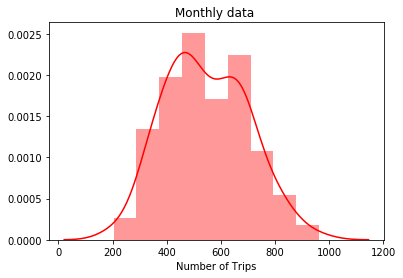

In [23]:
sns.distplot(data_monthly['Number of Trips'],color='r').set_title('Monthly data ')

Text(0.5, 1.0, 'Bimonthly data ')

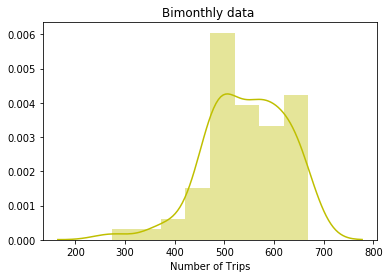

In [24]:
sns.distplot(data_bimonthly['Number of Trips'],color='y').set_title('Bimonthly data ')

Text(0.5, 1.0, 'Weekly data ')

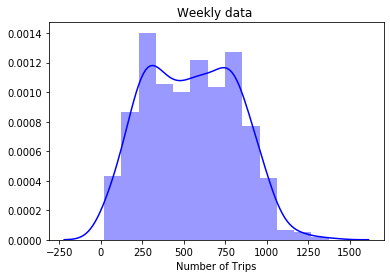

In [25]:
sns.distplot(data_weekly['Number of Trips'],color='b').set_title('Weekly data ')

In [26]:
dataset_2.columns

Index(['Unnamed: 0', 'completed_on', 'distance_travelled', 'end_location_lat',
       'end_location_long', 'start_location_long', 'start_location_lat'],
      dtype='object')

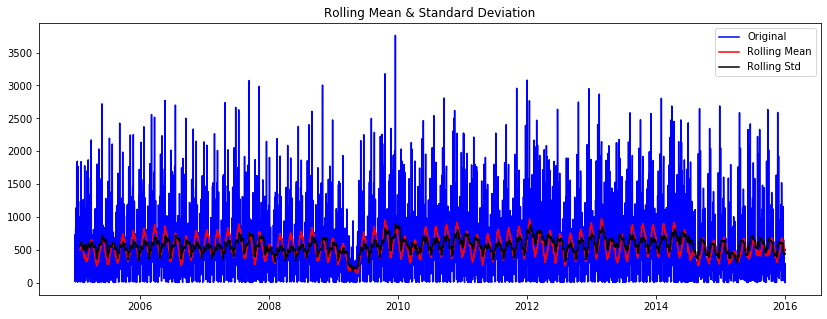

<Results of Dickey-Fuller Test>
Test Statistic                -1.411288e+01
p-value                        2.501849e-26
#Lags Used                     3.000000e+01
Number of Observations Used    3.986000e+03
Critical Value (1%)           -3.431992e+00
Critical Value (5%)           -2.862265e+00
Critical Value (10%)          -2.567156e+00
dtype: float64


In [27]:
def test_stationarity(timeseries):
    rolmean = timeseries.rolling(window=30).mean()
    rolstd = timeseries.rolling(window=30).std()
    
    plt.figure(figsize=(14,5))
    sns.despine(left=True)
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')

    plt.legend(loc='best'); plt.title('Rolling Mean & Standard Deviation')
    plt.show()
    
    print ('<Results of Dickey-Fuller Test>')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4],
                         index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
test_stationarity(data['Number of Trips'].dropna())

,count,mean,std,min,25%,50%,75%,max
Number of Trips,132.0,545.277496,152.550792,203.833333,435.41129,535.090860,662.625806,963.214286
holiday,132.0,45.565329,40.551561,0.000000,0.00000,48.387097,53.571429,150.000000


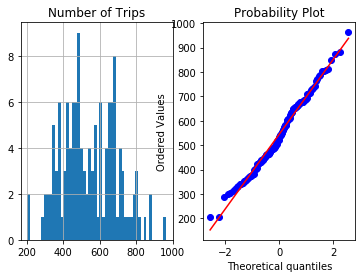

In [28]:
plt.subplot(1,2,1)
data_monthly['Number of Trips'].hist(bins=50)
plt.title('Number of Trips')
plt.subplot(1,2,2)
stats.probplot(data_monthly['Number of Trips'], plot=plt);
data_monthly.describe().T

,count,mean,std,min,25%,50%,75%,max
Number of Trips,67.0,544.443433,79.320894,273.524590,489.171470,556.114754,601.163934,668.580645
holiday,67.0,45.752752,29.453240,24.590164,24.590164,25.423729,72.580645,120.967742


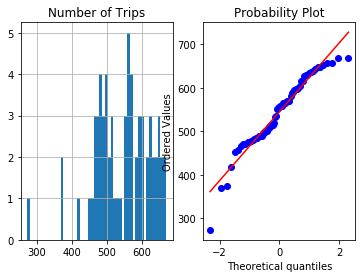

In [29]:
plt.subplot(1,2,1)
data_bimonthly['Number of Trips'].hist(bins=50)
plt.title('Number of Trips')
plt.subplot(1,2,2)
stats.probplot(data_bimonthly['Number of Trips'], plot=plt);
data_bimonthly.describe().T

,count,mean,std,min,25%,50%,75%,max
Number of Trips,575.0,544.590000,268.918840,19.285714,308.428571,542.714286,761.214286,1373.428571
holiday,575.0,46.397516,98.097407,0.000000,0.000000,0.000000,0.000000,750.000000


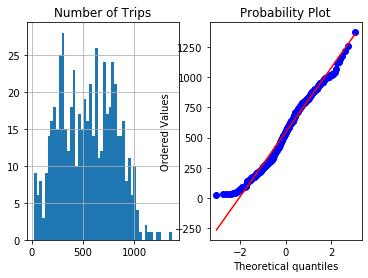

In [30]:
plt.subplot(1,2,1)
data_weekly['Number of Trips'].hist(bins=50)
plt.title('Number of Trips')
plt.subplot(1,2,2)
stats.probplot(data_weekly['Number of Trips'], plot=plt);
data_weekly.describe().T

,count,mean,std,min,25%,50%,75%,max
Number of Trips,4017.0,545.523774,588.523002,1.0,71.0,334.0,867.0,3763.0
holiday,4017.0,45.556385,257.440658,0.0,0.0,0.0,0.0,1500.0


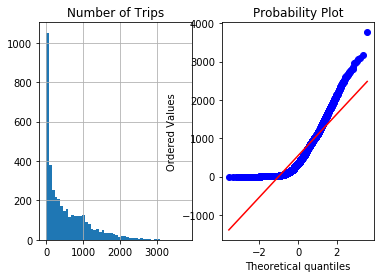

In [31]:
plt.subplot(1,2,1)
data['Number of Trips'].hist(bins=50)
plt.title('Number of Trips')
plt.subplot(1,2,2)
stats.probplot(data['Number of Trips'], plot=plt);
data.describe().T

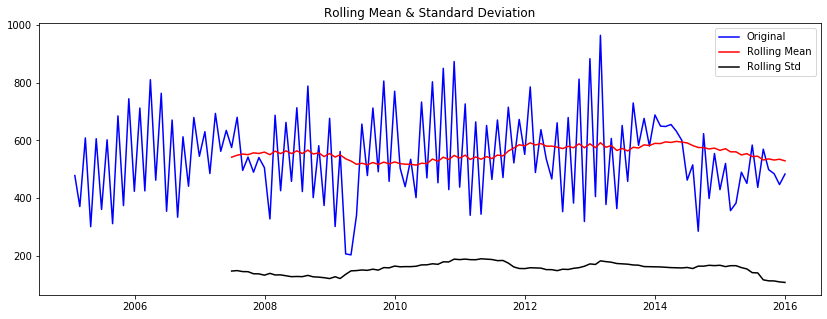

<Results of Dickey-Fuller Test>
Test Statistic                  -4.543662
p-value                          0.000164
#Lags Used                       2.000000
Number of Observations Used    129.000000
Critical Value (1%)             -3.482088
Critical Value (5%)             -2.884219
Critical Value (10%)            -2.578864
dtype: float64


In [32]:
test_stationarity(data_monthly['Number of Trips'].dropna())

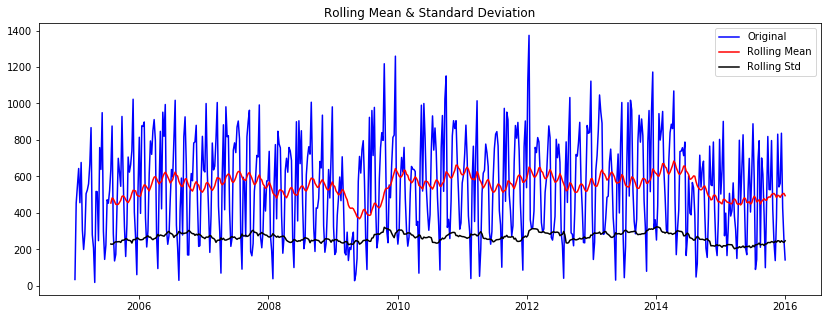

<Results of Dickey-Fuller Test>
Test Statistic                  -4.906006
p-value                          0.000034
#Lags Used                      19.000000
Number of Observations Used    555.000000
Critical Value (1%)             -3.442187
Critical Value (5%)             -2.866762
Critical Value (10%)            -2.569551
dtype: float64


In [33]:
test_stationarity(data_weekly['Number of Trips'].dropna())

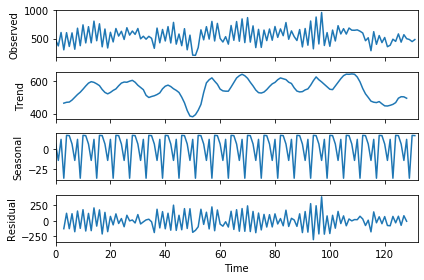

In [34]:
decomposed = sm.tsa.seasonal_decompose(np.array(data_monthly['Number of Trips']),freq=6) # The frequency is semestral
figure = decomposed.plot()

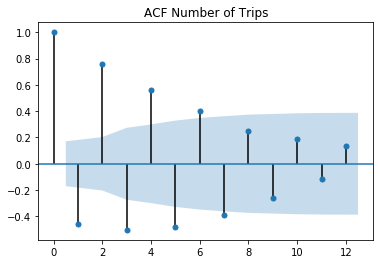

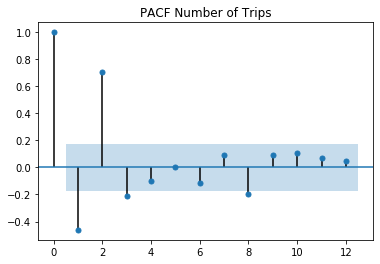

In [35]:
plt.show()
plot_acf(data_monthly['Number of Trips'],lags=12,title="ACF Number of Trips")
plt.show()
plot_pacf(data_monthly['Number of Trips'],lags=12,title="PACF Number of Trips")
plt.show()

In [36]:
#The test statistic is negative, we reject the null hypothesis (it looks stationary).

In [37]:
def sarimax_predictor(actual, order, seasonal_order, t , start, title):
    mdl = sm.tsa.statespace.SARIMAX(actual[start:],
                                            order=order, seasonal_order=seasonal_order,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
    results = mdl.fit()
#    results.plot_diagnostics()
    print(results.summary())
    predict = results.predict(start=start, end=len(actual)+t)
    for i in range(len(predict)):
        if(predict[i]<0):
            predict[i]=predict[i]*-1
    fig = go.Figure(
        data=[go.Scatter(y=actual[0:-t],x=actual[0:-t].index, name= 'Actual'),
          go.Scatter(y=actual[-t-1::],x=actual[-t-1::].index, name= 'Test'),
          go.Scatter(y=predict, x=predict.index, name= 'Predict')],
        layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        )
    )
    fig.update_layout(title_text= title)
    fig.show()
    return predict
#defined function when we need to use exogenous variables
# def sarimax_predictor_exog(actual, order, seasonal_order, t, title, exog):
#     mdl = sm.tsa.statespace.SARIMAX(actual[0:-t],
#                                             order=order, seasonal_order=seasonal_order, exog = exog[0:-t],
#                                             enforce_stationarity=False,
#                                             enforce_invertibility=False, time_varying_regression = False,
#                                             mle_regression = True)
#     results = mdl.fit()
#     results.plot_diagnostics()
#     print(results.summary())
#     #use only exogenous to forecasting (test set)
#     predict = results.predict(start=0, end=len(actual), exog=exog[-t-1::]) 

#     fig = go.Figure(
#         data=[go.Scatter(y=actual[0:-t],x=actual[0:-t].index, name= 'Actual'),
#           go.Scatter(y=actual[-t-1::],x=actual[-t-1::].index, name= 'Test'),
#           go.Scatter(y=predict, x=predict.index, name= 'Predict')],
#         layout=go.Layout(
#         xaxis=dict(showgrid=False),
#         yaxis=dict(showgrid=False),
#         )
#     )
#     fig.update_layout(title_text= title)
#     fig.show()
#     return predict

#evaluation test
def rmse(actual, predict, title):
    from sklearn import metrics
    rmse = np.sqrt(metrics.mean_squared_error(actual, predict))
    print('The RMSE of ' + title + ' is:', rmse)

In [38]:
start = 0
predicted_results = sarimax_predictor(data_monthly['Number of Trips'], [5,1,3], [1,1,0,26], 12, 1,
                                                  'Monthly forecast - Number of trips')
# print(rmse(data_monthly,predicted_results[:132],'checking'))

                                 Statespace Model Results                                 
Dep. Variable:                    Number of Trips   No. Observations:                  131
Model:             SARIMAX(5, 1, 3)x(1, 1, 0, 26)   Log Likelihood                -452.983
Date:                            Mon, 16 Mar 2020   AIC                            925.965
Time:                                    12:42:11   BIC                            948.870
Sample:                                02-28-2005   HQIC                           935.093
                                     - 12-31-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.7259      0.591     -2.919      0.004      -2.885      -0.567
ar.L2         -0.1524      0.896   

In [39]:
start = 0
predicted_results2 = sarimax_predictor(data_weekly['Number of Trips'], [1,1,1], [1,1,0,24], 7*2, start,
                                                  'Weekly forecast - Number of trips')
#print(rmse(data_weekly,predicted_results2[:575],'checking'))

                                 Statespace Model Results                                 
Dep. Variable:                    Number of Trips   No. Observations:                  575
Model:             SARIMAX(1, 1, 1)x(1, 1, 0, 24)   Log Likelihood               -3739.188
Date:                            Mon, 16 Mar 2020   AIC                           7486.376
Time:                                    12:42:18   BIC                           7503.430
Sample:                                01-02-2005   HQIC                          7493.054
                                     - 01-03-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3326      0.048      6.921      0.000       0.238       0.427
ma.L1         -1.0000     10.915   

In [40]:
predicted_result_foods_bimonthly = sarimax_predictor(data_bimonthly['Number of Trips'], [8,1,0], [1,0,0,6], 5, 1,
                                                     'Bimonthly forecast')
# print(rmse(data_bimonthly,predicted_result_foods_bimonthly[:67],'checking'))

                                 Statespace Model Results                                
Dep. Variable:                   Number of Trips   No. Observations:                   66
Model:             SARIMAX(8, 1, 0)x(1, 0, 0, 6)   Log Likelihood                -287.926
Date:                           Mon, 16 Mar 2020   AIC                            595.852
Time:                                   12:42:18   BIC                            615.170
Sample:                               03-31-2005   HQIC                           603.234
                                    - 01-31-2016                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3076      0.160     -1.928      0.054      -0.620       0.005
ar.L2         -0.3901      0.181     -2.160

In [41]:
d=data.ix[3800:4017,0:1]
d

,Number of Trips
Pickup_Date,
2015-05-29,4
2015-05-30,162
2015-05-31,395
2015-06-01,17
2015-06-02,1
...,...
2015-12-27,20
2015-12-28,278
2015-12-29,1


In [42]:
predicted_result_daily = sarimax_predictor(d['Number of Trips'], [5,1,4], [1,1,0,21], 50, 0,
                                                     'Daily forecast')

                                 Statespace Model Results                                 
Dep. Variable:                    Number of Trips   No. Observations:                  217
Model:             SARIMAX(5, 1, 4)x(1, 1, 0, 21)   Log Likelihood               -1344.044
Date:                            Mon, 16 Mar 2020   AIC                           2710.089
Time:                                    12:42:29   BIC                           2744.518
Sample:                                05-29-2015   HQIC                          2724.061
                                     - 12-31-2015                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7495      0.193     -3.880      0.000      -1.128      -0.371
ar.L2         -0.1296      0.223   

In [43]:
data2.index=data2['Unnamed: 0']
np.dtype(data2['Number of Vehicles'])
#data2['Number of Vehicles'] = data2['Number of Vehicles'].map({' -   ': 12})
set(data2['Number of Vehicles'])
data2['Number of Vehicles'].replace([' -   '], [110], inplace=True)

In [44]:
data2 = data2.astype({'Number of Vehicles':int})
np.dtype(data2['Number of Vehicles'])
data2=data2.drop('Pickup_Date',1)
data2

,Unnamed: 0,Number of Trips,Number of Vehicles,holiday
Unnamed: 0,,,,
0,0,26,17,1500
1,1,45,24,0
2,2,731,36,0
3,3,10,9,0
4,4,814,62,0
...,...,...,...,...
4012,4012,20,12,0
4013,4013,278,29,0
4014,4014,1,1,0


In [45]:
# x_train=x_train.to_frame()
x_train,x_test,y_train,y_test=train_test_split(data2,data2['Number of Vehicles'],test_size=0.3,shuffle=False)
y_train=y_train.to_frame()
print(type(x_train))
x_train.head()

<class 'pandas.core.frame.DataFrame'>


,Unnamed: 0,Number of Trips,Number of Vehicles,holiday
Unnamed: 0,,,,
0,0,26,17,1500
1,1,45,24,0
2,2,731,36,0
3,3,10,9,0
4,4,814,62,0


In [46]:
xx=data2
x_train=x_train.drop('Number of Vehicles',1)

In [47]:
data2

,Unnamed: 0,Number of Trips,Number of Vehicles,holiday
Unnamed: 0,,,,
0,0,26,17,1500
1,1,45,24,0
2,2,731,36,0
3,3,10,9,0
4,4,814,62,0
...,...,...,...,...
4012,4012,20,12,0
4013,4013,278,29,0
4014,4014,1,1,0


In [48]:
x_test=x_test.drop('Number of Vehicles',1)

In [49]:
num_folds = 10
seed = 0
scoring = 'neg_mean_squared_error'
kfold = KFold(n_splits=num_folds, random_state=seed)

In [50]:
model = XGBRegressor(n_estimators=70 , learning_rate = .1)
score_= cross_val_score(model, x_train, y_train, cv=kfold, scoring=scoring)
model.fit(x_train, y_train)
prediction=model.predict(x_train)
predictions = model.predict(x_test)

print(metrics.r2_score(y_test, predictions))
rmse = np.sqrt(metrics.mean_squared_error(y_test, predictions))
print('Root Mean Square Error',rmse)

[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:42:31] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

In [51]:
data2[['Number of Trips','Number of Vehicles','holiday']].corr(method='pearson')

,Number of Trips,Number of Vehicles,holiday
Number of Trips,1.000000,0.681527,-0.003493
Number of Vehicles,0.681527,1.000000,0.016062
holiday,-0.003493,0.016062,1.000000


In [52]:
reg=LinearRegression()

In [53]:
reg.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [54]:
a=reg.predict(x_test)

In [55]:
data2

,Unnamed: 0,Number of Trips,Number of Vehicles,holiday
Unnamed: 0,,,,
0,0,26,17,1500
1,1,45,24,0
2,2,731,36,0
3,3,10,9,0
4,4,814,62,0
...,...,...,...,...
4012,4012,20,12,0
4013,4013,278,29,0
4014,4014,1,1,0


In [56]:
cols=['Unnamed: 0','Number of Trips','holiday']
b=reg.predict(data2[cols])
b

array([[ 46.63556023],
       [ 31.26185513],
       [106.42935016],
       ...,
       [ 28.15308542],
       [ 59.82010505],
       [ 28.26351185]])

In [57]:
c=model.predict(data2[cols])
b=b.reshape(4017,)
c.shape

(4017,)

In [58]:
fig = go.Figure(
        data=[go.Scatter(y=data2['Number of Vehicles'],x=data2.index, name= 'Actual'),
          go.Scatter(y=b,x=data2.index, name= 'sklearn'),
             go.Scatter(y=c,x=data2.index, name= 'xgboost')],
        layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        )
    )
fig.show()

In [59]:
# 1st part almost done just aggregate for some predicted data.
# MAPA,,LSTM,,then again forecasting of latitudes and longitudes,,Geopandas. 

In [60]:
data2.index=data.index
data2

,Unnamed: 0,Number of Trips,Number of Vehicles,holiday
Pickup_Date,,,,
2005-01-01,0,26,17,1500
2005-01-02,1,45,24,0
2005-01-03,2,731,36,0
2005-01-04,3,10,9,0
2005-01-05,4,814,62,0
...,...,...,...,...
2015-12-27,4012,20,12,0
2015-12-28,4013,278,29,0
2015-12-29,4014,1,1,0


In [61]:
predicted_results

2005-03-31    157.579649
2005-04-30    395.984927
2005-05-31    752.257795
2005-06-30    168.712096
2005-07-31    652.607960
                 ...    
2016-10-31    452.919570
2016-11-30    427.185374
2016-12-31    507.394920
2017-01-31    418.842576
2017-02-28    598.035235
Freq: M, Length: 144, dtype: float64

In [62]:
def alpha(actual, predict):
    RMSE =[]
    for i in np.arange(0.5,15, 0.01):
        RMSE.append([i,np.sqrt(metrics.mean_squared_error(actual, predict*i))])
    return np.array(RMSE)[np.argmin(np.array(RMSE)[:,1]),0]

In [63]:
#step of combination
predicted_result_foods_bimonthly1 = predicted_result_foods_bimonthly.resample('W').mean()
predicted_results1 = predicted_results.resample('W').mean()
#equally assigns the mean value of the low frequency time series
predictions_foods = pd.DataFrame({'bimonthly': predicted_result_foods_bimonthly1.groupby(predicted_result_foods_bimonthly1.notnull().cumsum()).transform(lambda x : x.sum()/len(x)),
                         'monthly': predicted_results1.groupby(predicted_results1.notnull().cumsum()).transform(lambda x : x.sum()/len(x)),
                         'weekly': predicted_results2[1::]})
prediction_foods_mean = pd.DataFrame.mean(predictions_foods, axis = 1)
prediction_foods_median = pd.DataFrame.median(predictions_foods, axis = 1)
prediction_foods_min = pd.DataFrame.min(predictions_foods, axis = 1)
prediction_foods_max = pd.DataFrame.max(predictions_foods, axis = 1)
alpha_foods_max = alpha(data_weekly['Number of Trips'][start+1:-28], prediction_foods_max[start+1:-3*28-8])
alpha_foods_min = alpha(data_weekly['Number of Trips'][start+1:-28], prediction_foods_min[start+1:-3*28-8])
alpha_foods_mean = alpha(data_weekly['Number of Trips'][start+1:-28], prediction_foods_mean[start+1:-3*28-8])
alpha_median = alpha(data_weekly['Number of Trips'][start+1:-28], prediction_foods_median[start+1:-3*28-8])

fig = go.Figure(
    data=[go.Scatter(y=data_weekly['Number of Trips'], x = data_weekly.index, name= 'Actual'), 
          go.Scatter(y=prediction_foods_min[0:-1]*alpha_foods_min, x= data_weekly.index, name= 'Predict Min'),
          go.Scatter(y=prediction_foods_max[0:-1]*alpha_foods_max, x= data_weekly.index, name= 'Predict Max'),
          go.Scatter(y=prediction_foods_mean[0:-1]*alpha_foods_mean, x= data_weekly.index, name= 'Predict Mean'),
          go.Scatter(y=prediction_foods_median[0:-1]*alpha_median, x= data_weekly.index, name= 'Predict median')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Foods Category - MAPA SARIMA forecast")
fig.show()

In [64]:
# LSTM from here

In [65]:
data_monthly

,Number of Trips,holiday
Pickup_Date,,
2005-01-31,478.161290,96.774194
2005-02-28,371.035714,53.571429
2005-03-31,608.419355,0.000000
2005-04-30,301.300000,0.000000
2005-05-31,605.645161,48.387097
...,...,...
2015-08-31,569.483871,0.000000
2015-09-30,498.766667,50.000000
2015-10-31,484.451613,48.387097


In [66]:
data

,Number of Trips,Number of Vehicles,holiday
Pickup_Date,,,
2005-01-01,26,17,1500
2005-01-02,45,24,0
2005-01-03,731,36,0
2005-01-04,10,9,0
2005-01-05,814,62,0
...,...,...,...
2015-12-27,20,12,0
2015-12-28,278,29,0
2015-12-29,1,1,0


In [67]:
dataset = data['Number of Trips'].values #numpy.ndarray
dataset = dataset.astype('float32')
dataset = np.reshape(dataset, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
train_size = int(len(dataset) * 0.80)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

def create_dataset(dataset, look_back=10):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)
    
look_back = 30
X_train, Y_train = create_dataset(train, look_back)
X_test, Y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
data['Number of Trips'].shape

(4017,)

In [68]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.7))
model.add(LSTM(80))
model.add(Dropout(0.7))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(X_train, Y_train, epochs=10, batch_size=40, validation_data=(X_test, Y_test), 
                    callbacks=[EarlyStopping(monitor='val_loss', patience=10)], verbose=1, shuffle=False)

model.summary()

Train on 3182 samples, validate on 773 samples
Epoch 1/10
3182/3182 [==============================] - 3s 989us/step - loss: 0.0261 - val_loss: 0.0229
Epoch 2/10
3182/3182 [==============================] - 1s 169us/step - loss: 0.0225 - val_loss: 0.0226
Epoch 3/10
3182/3182 [==============================] - 1s 187us/step - loss: 0.0213 - val_loss: 0.0227
Epoch 4/10
3182/3182 [==============================] - 1s 190us/step - loss: 0.0211 - val_loss: 0.0228
Epoch 5/10
3182/3182 [==============================] - 1s 189us/step - loss: 0.0208 - val_loss: 0.0229
Epoch 6/10
3182/3182 [==============================] - 1s 193us/step - loss: 0.0203 - val_loss: 0.0229
Epoch 7/10
3182/3182 [==============================] - 1s 192us/step - loss: 0.0204 - val_loss: 0.0230
Epoch 8/10
3182/3182 [==============================] - 1s 187us/step - loss: 0.0198 - val_loss: 0.0230
Epoch 9/10
3182/3182 [==============================] - 1s 193us/step - loss: 0.0198 - val_loss: 0.0230
Epoch 10/10
3182/

In [69]:
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)
# invert predictions
train_predict = scaler.inverse_transform(train_predict)
Y_train = scaler.inverse_transform([Y_train])
test_predict = scaler.inverse_transform(test_predict)
Y_test = scaler.inverse_transform([Y_test])
print('Train Mean Absolute Error:', mean_absolute_error(Y_train[0], train_predict[:,0]))
print('Train Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_train[0], train_predict[:,0])))
print('Test Mean Absolute Error:', mean_absolute_error(Y_test[0], test_predict[:,0]))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test[0], test_predict[:,0])))

Train Mean Absolute Error: 396.9448865926472
Train Root Mean Squared Error: 512.0039188296446
Test Mean Absolute Error: 441.3070039806526
Test Root Mean Squared Error: 569.8671502790005


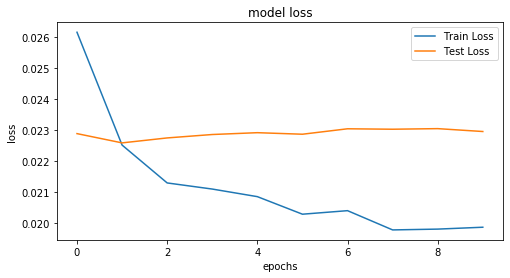

In [70]:
plt.figure(figsize=(8,4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()

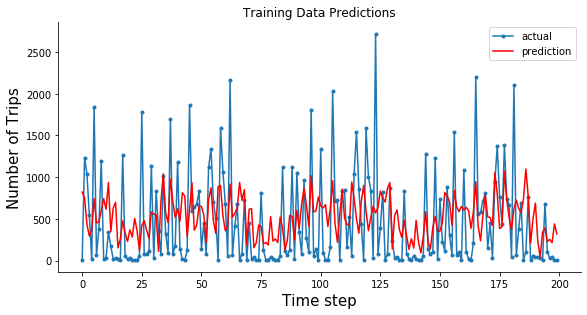

In [71]:
aa=[x for x in range(200)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_train[0][:200], marker='.', label="actual")
plt.plot(aa, train_predict[:,0][:200], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.ylabel('Number of Trips', size=15)
plt.xlabel('Time step', size=15)
plt.legend(loc='best',fontsize=10)
plt.title("Training Data Predictions")
plt.show()

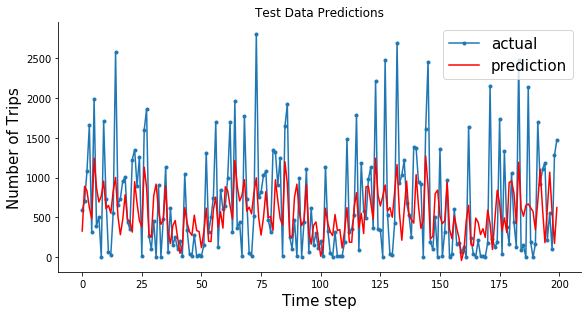

In [72]:
aa=[x for x in range(200)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test[0][:200], marker='.', label="actual")
plt.plot(aa, test_predict[:,0][:200], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.ylabel('Number of Trips', size=15)
plt.xlabel('Time step', size=15)
plt.legend(loc='best',fontsize=15)
plt.title('Test Data Predictions')
plt.show()

In [228]:
dataset_2.drop('Unnamed: 0',1,inplace=True)

In [229]:
dataset_2

,completed_on,distance_travelled,end_location_lat,end_location_long,start_location_long,start_location_lat
0,2015-01-01 00:00:00,285.0,30.27,-97.75,-97.75,30.27
1,2015-01-01 01:00:00,1029.0,30.27,-97.74,-97.75,30.27
2,2015-01-01 02:00:00,8459.0,38.68,-121.04,-97.05,30.65
3,2015-01-01 03:00:00,443.0,38.68,-121.04,-97.04,30.68
4,2015-01-01 04:00:00,568.0,38.68,-121.04,-97.04,30.20
...,...,...,...,...,...,...
10004,2016-02-21 20:00:00,4046.0,30.26,-97.74,-97.74,30.29
10005,2016-02-21 21:00:00,2109.0,30.27,-97.74,-97.74,30.26
10006,2016-02-21 22:00:00,10210.0,30.29,-97.75,-97.72,30.24
10007,2016-02-21 23:00:00,6833.0,30.27,-97.74,-97.74,30.31


Text(0.5, 1.0, 'Data Visualization')

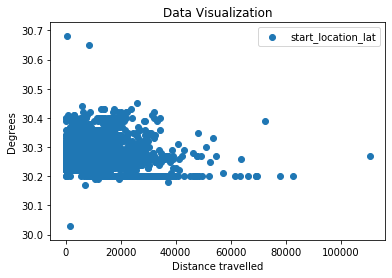

In [75]:
plt.scatter('distance_travelled','start_location_lat',data=dataset_2)
#plt.scatter('distance_travelled','start_location_long',data=dataset_2)
plt.legend(loc='best')
plt.xlabel('Distance travelled')
plt.ylabel('Degrees')
plt.title('Data Visualization')

Text(0.5, 1.0, 'Data Visualization')

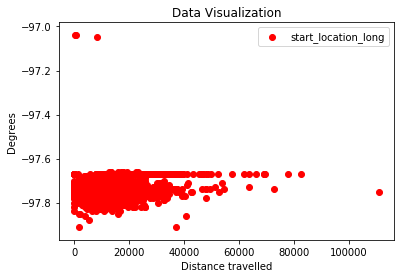

In [76]:
plt.scatter('distance_travelled','start_location_long',data=dataset_2,color='r')
plt.legend(loc='best')
plt.xlabel('Distance travelled')
plt.ylabel('Degrees')
plt.title('Data Visualization')

In [77]:
fig = go.Figure(
    data=[go.Scatter(y=dataset_2['start_location_lat'], x=dataset_2.completed_on, name= 'Latitude')
         ],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Pickup Location ")
fig.show()

In [78]:
fig = go.Figure(
    data=[
          go.Scatter(y=dataset_2['start_location_long'], x=dataset_2.completed_on, name= 'Longitude'),],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Pickup Location ")
fig.show()

In [79]:
fig = go.Figure(
    data=[go.Scatter(y=dataset_2['distance_travelled'], x=dataset_2.completed_on, name= 'Distance')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Distance Travelled ")
fig.show()

In [230]:
dataset_2.index=dataset_2.completed_on

In [231]:
dataset_2.drop('completed_on',1,inplace=True)

In [232]:
dataset_2.index=pd.to_datetime(dataset_2.index )

In [233]:
dataset_2.isnull().sum()
dataset_2['distance_travelled']=dataset_2['distance_travelled'].fillna(method='ffill')

In [84]:
data_monthly_2 = dataset_2.resample('M').mean() #mensal resampling
data_weekly_2 = dataset_2.resample('W').mean() #weekly resampling
data_bimonthly_2 = dataset_2.resample('2M').mean() #bimonthy resamply

In [85]:
data_weekly_2

,distance_travelled,end_location_lat,end_location_long,start_location_long,start_location_lat
completed_on,,,,,
2015-01-04,5734.572917,30.534271,-98.468958,-97.721771,30.278646
2015-01-11,4962.779762,30.271012,-97.746905,-97.744167,30.269286
2015-01-18,5310.309524,30.269107,-97.741845,-97.743690,30.268155
2015-01-25,5705.101190,30.267738,-97.743571,-97.743929,30.266786
2015-02-01,5108.869048,30.264643,-97.742917,-97.747738,30.264405
...,...,...,...,...,...
2016-01-31,8548.250000,30.279405,-97.742321,-97.741548,30.273869
2016-02-07,8428.952381,30.270119,-97.746488,-97.735893,30.268274
2016-02-14,7843.136905,30.267560,-97.735000,-97.736905,30.277321


Text(0.5, 1.0, 'Distance Travelled')

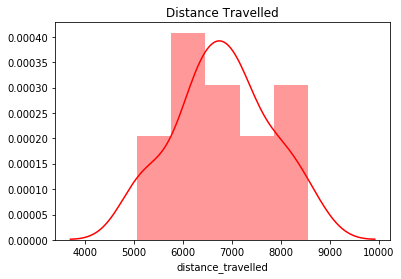

In [86]:
sns.distplot(data_monthly_2.distance_travelled,color='r').set_title('Distance Travelled')

Text(0.5, 1.0, 'Distance Travelled')

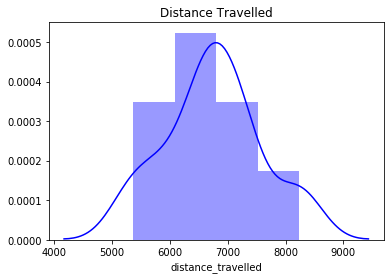

In [87]:
sns.distplot(data_bimonthly_2.distance_travelled,color='b').set_title('Distance Travelled')

Text(0.5, 1.0, 'Distance Travelled')

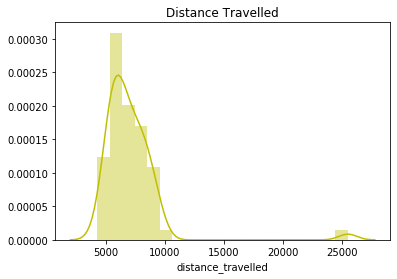

In [88]:
sns.distplot(data_weekly_2.distance_travelled,color='y').set_title('Distance Travelled')

Text(0.5, 1.0, 'Start Location Longitude Monthly')

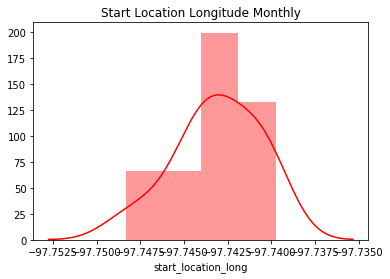

In [89]:
sns.distplot(data_monthly_2.start_location_long,color='r').set_title('Start Location Longitude Monthly')

Text(0.5, 1.0, 'Start Location Longitude Bimonthly')

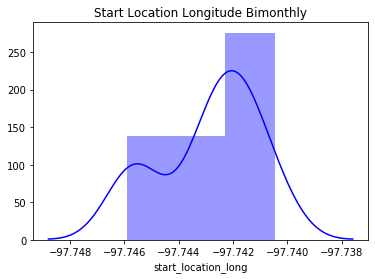

In [90]:
sns.distplot(data_bimonthly_2.start_location_long,color='b').set_title('Start Location Longitude Bimonthly')

Text(0.5, 1.0, 'Start Location Longitude Weekly')

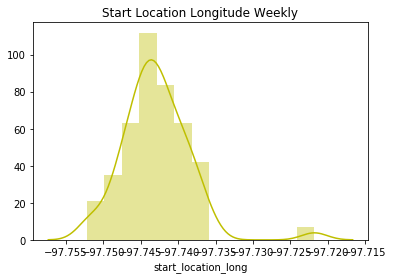

In [91]:
sns.distplot(data_weekly_2.start_location_long,color='y').set_title('Start Location Longitude Weekly')

In [92]:
fig = go.Figure(
    data=[go.Scatter(y=data_weekly_2['distance_travelled'], x=data_weekly_2.index, name= 'Distance')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Distance Travelled ")
fig.show()

In [93]:
fig = go.Figure(
    data=[go.Scatter(y=data_monthly_2['distance_travelled'], x=data_monthly_2.index, name= 'Distance')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Distance Travelled ")
fig.show()

In [94]:
fig = go.Figure(
    data=[go.Scatter(y=data_bimonthly_2['distance_travelled'], x=data_bimonthly_2.index, name= 'Distance')],
    layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
    )
)
fig.update_layout(title_text="Distance Travelled ")
fig.show()

In [95]:
# defined function when we need to use exogenous variables
def sarimax_predictor_exog(actual, order, seasonal_order, t, title, exog):
    mdl = sm.tsa.statespace.SARIMAX(actual[:],
                                            order=order, seasonal_order=seasonal_order, exog = exog[:],
                                            enforce_stationarity=False,
                                            enforce_invertibility=False, time_varying_regression = False,
                                            mle_regression = True)
    results = mdl.fit()
    #results.plot_diagnostics()
    print(results.summary())
    #use only exogenous to forecasting (test set)
    predict = results.predict(start=0, end=len(actual), exog=exog[0:1 :]) 

    fig = go.Figure(
        data=[go.Scatter(y=actual[0:-t],x=actual[0:-t].index, name= 'Actual'),
          go.Scatter(y=actual[-t-1::],x=actual[-t-1::].index, name= 'Test'),
          go.Scatter(y=predict[2:], x=predict.index[2:], name= 'Predict')],
        layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        )
    )
    fig.update_layout(title_text= title)
    fig.show()
    return predict

In [96]:
exog=dataset_2['distance_travelled']
exog.index=dataset_2.index
print(np.dtype(exog.index))
print(exog.head())
# cols=['start_location_lat','start_location_long']
# exog1=dataset_2[cols]
# exog1.index=dataset_2.index
# print(exog1.head())

datetime64[ns]
completed_on
2015-01-01 00:00:00     285.0
2015-01-01 01:00:00    1029.0
2015-01-01 02:00:00    8459.0
2015-01-01 03:00:00     443.0
2015-01-01 04:00:00     568.0
Name: distance_travelled, dtype: float64


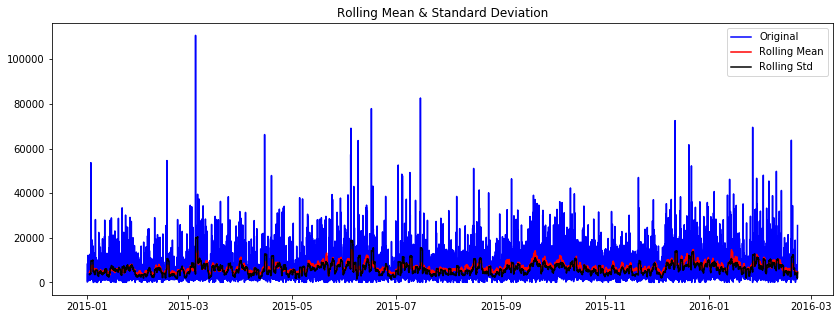

<Results of Dickey-Fuller Test>
Test Statistic                -1.179873e+01
p-value                        9.441883e-22
#Lags Used                     3.500000e+01
Number of Observations Used    9.973000e+03
Critical Value (1%)           -3.431006e+00
Critical Value (5%)           -2.861830e+00
Critical Value (10%)          -2.566924e+00
dtype: float64


In [97]:
test_stationarity(dataset_2['distance_travelled'].dropna())

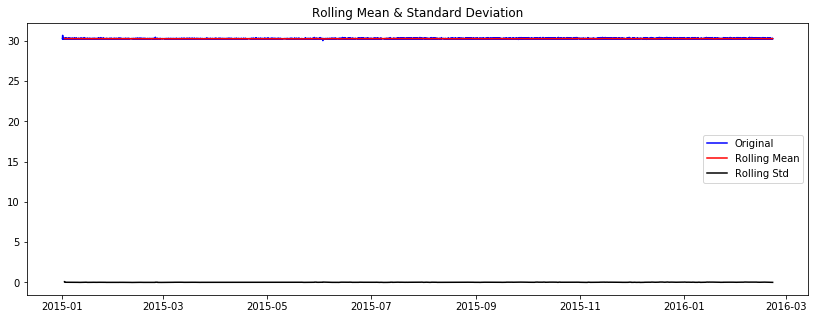

<Results of Dickey-Fuller Test>
Test Statistic                -1.742988e+01
p-value                        4.773660e-30
#Lags Used                     2.200000e+01
Number of Observations Used    9.986000e+03
Critical Value (1%)           -3.431005e+00
Critical Value (5%)           -2.861829e+00
Critical Value (10%)          -2.566924e+00
dtype: float64


In [98]:
test_stationarity(dataset_2['start_location_lat'].dropna())

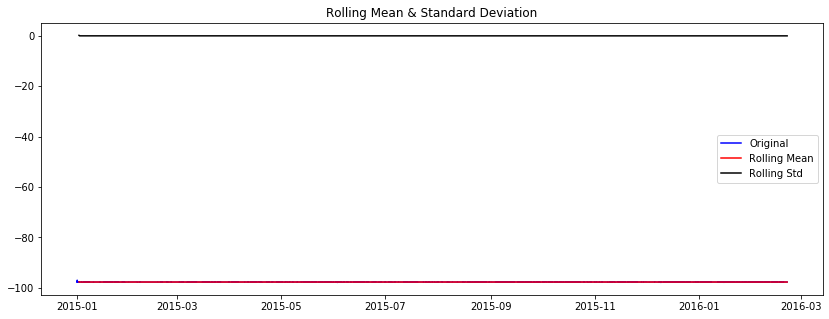

<Results of Dickey-Fuller Test>
Test Statistic                -1.749871e+01
p-value                        4.397208e-30
#Lags Used                     2.200000e+01
Number of Observations Used    9.986000e+03
Critical Value (1%)           -3.431005e+00
Critical Value (5%)           -2.861829e+00
Critical Value (10%)          -2.566924e+00
dtype: float64


In [99]:
test_stationarity(dataset_2['start_location_long'].dropna())

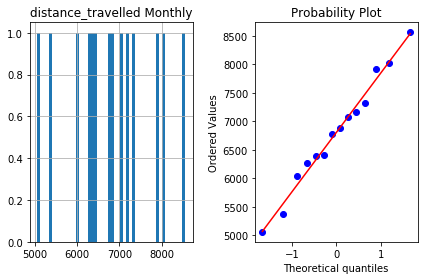

In [100]:
plt.subplot(1,2,1)
data_monthly_2['distance_travelled'].hist(bins=50)
plt.title('distance_travelled Monthly')
plt.subplot(1,2,2)
stats.probplot(data_monthly_2['distance_travelled'], plot=plt);
data_monthly_2.describe().T
plt.tight_layout()

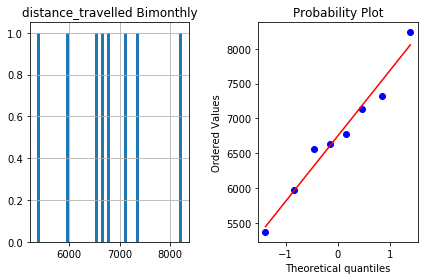

In [101]:
plt.subplot(1,2,1)
data_bimonthly_2['distance_travelled'].hist(bins=50)
plt.title('distance_travelled Bimonthly')
plt.subplot(1,2,2)
stats.probplot(data_bimonthly_2['distance_travelled'], plot=plt);
data_bimonthly_2.describe().T
plt.tight_layout()

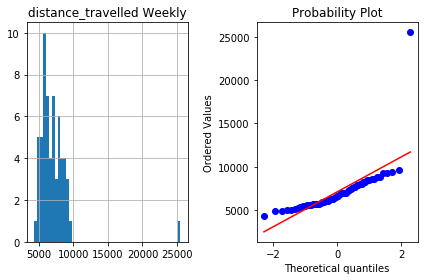

In [102]:
plt.subplot(1,2,1)
data_weekly_2['distance_travelled'].hist(bins=50)
plt.title('distance_travelled Weekly')
plt.subplot(1,2,2)
stats.probplot(data_weekly_2['distance_travelled'], plot=plt);
data_weekly_2.describe().T
plt.tight_layout()

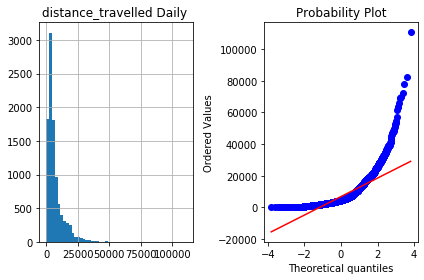

In [103]:
plt.subplot(1,2,1)
dataset_2['distance_travelled'].hist(bins=50)
plt.title('distance_travelled Daily ')
plt.subplot(1,2,2)
stats.probplot(dataset_2['distance_travelled'], plot=plt);
dataset_2.describe().T
plt.tight_layout()

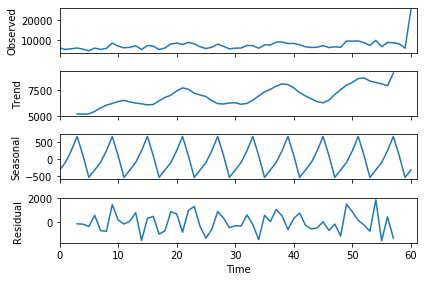

In [104]:
decomposed = sm.tsa.seasonal_decompose(np.array(data_weekly_2['distance_travelled']),freq=6) # The frequency is semestral
figure = decomposed.plot()

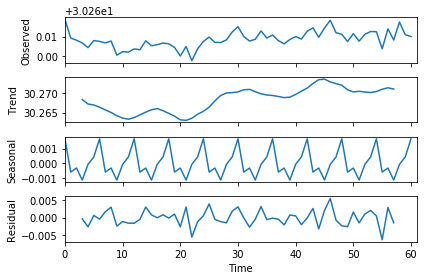

In [105]:
decomposed = sm.tsa.seasonal_decompose(np.array(data_weekly_2['start_location_lat']),freq=6) # The frequency is semestral
figure = decomposed.plot()

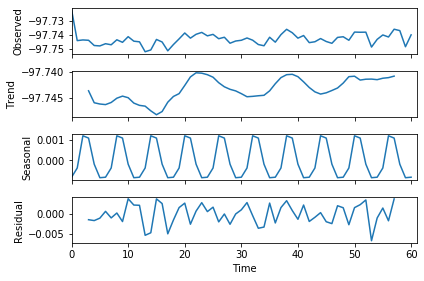

In [106]:
decomposed = sm.tsa.seasonal_decompose(np.array(data_weekly_2['start_location_long']),freq=6) # The frequency is semestral
figure = decomposed.plot()

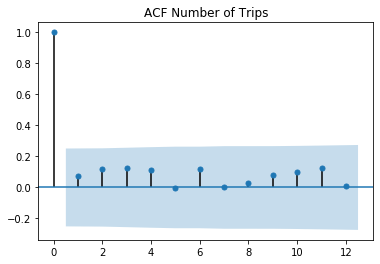

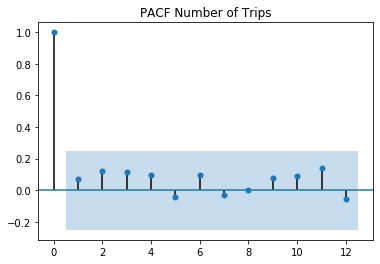

In [107]:
plt.show()
plot_acf(data_weekly_2['distance_travelled'],lags=12,title="ACF Number of Trips")
plt.show()
plot_pacf(data_weekly_2['distance_travelled'],lags=12,title="PACF Number of Trips")
plt.show()

In [108]:
cols=['start_location_lat','start_location_long']
exog1=dataset_2[cols]
exog_w=data_weekly_2[cols]
exog_m=data_monthly_2[cols]
exog_b=data_bimonthly_2[cols]

In [109]:
predicted_result = sarimax_predictor_exog(dataset_2.distance_travelled, [1,0,1], [2,1,0,7], 28*7,'Daily forecast - Foods', exog1)

                                 Statespace Model Results                                
Dep. Variable:                distance_travelled   No. Observations:                10009
Model:             SARIMAX(1, 0, 1)x(2, 1, 0, 7)   Log Likelihood             -103765.207
Date:                           Mon, 16 Mar 2020   AIC                         207544.414
Time:                                   12:43:27   BIC                         207594.878
Sample:                               01-01-2015   HQIC                        207561.497
                                    - 02-22-2016                                         
Covariance Type:                             opg                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
start_location_lat  -3958.2367   2773.015     -1.427      0.153   -9393.245    1476.772
start_location_l

In [110]:
predicted_result = sarimax_predictor_exog(data_weekly_2.distance_travelled, [4,0,2], [1,0,2,2], 6*1,'Weekly forecast - Foods', exog_w)

                                 Statespace Model Results                                
Dep. Variable:                distance_travelled   No. Observations:                   61
Model:             SARIMAX(4, 0, 2)x(1, 0, 2, 2)   Log Likelihood                -503.468
Date:                           Mon, 16 Mar 2020   AIC                           1030.936
Time:                                   12:43:29   BIC                           1054.804
Sample:                               01-04-2015   HQIC                          1040.141
                                    - 02-28-2016                                         
Covariance Type:                             opg                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
start_location_lat   4.029e+04   2.12e+05      0.190      0.849   -3.75e+05    4.55e+05
start_location_l

In [111]:
predicted_result = sarimax_predictor_exog(data_monthly_2.distance_travelled, [2,0,1], [3,0,0,1], 6*1,'Weekly forecast - Foods', exog_m)

                                 Statespace Model Results                                
Dep. Variable:                distance_travelled   No. Observations:                   14
Model:             SARIMAX(2, 0, 1)x(3, 0, 0, 1)   Log Likelihood                 -68.556
Date:                           Mon, 16 Mar 2020   AIC                            155.112
Time:                                   12:43:29   BIC                            156.887
Sample:                               01-31-2015   HQIC                           151.282
                                    - 02-29-2016                                         
Covariance Type:                             opg                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
start_location_lat   9.145e+04      3e+05      0.304      0.761   -4.98e+05     6.8e+05
start_location_l

In [112]:
predicted_result = sarimax_predictor_exog(data_bimonthly_2.distance_travelled, [1,0,0], [1,0,0,1], 2*1,'Bimonthly forecast - Foods', exog_b)

                                 Statespace Model Results                                
Dep. Variable:                distance_travelled   No. Observations:                    8
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 1)   Log Likelihood                 -44.561
Date:                           Mon, 16 Mar 2020   AIC                             99.121
Time:                                   12:43:30   BIC                             98.080
Sample:                               01-31-2015   HQIC                            94.953
                                    - 03-31-2016                                         
Covariance Type:                             opg                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
start_location_lat    1.27e+05   7.65e+04      1.659      0.097    -2.3e+04    2.77e+05
start_location_l

In [113]:
exog_2=dataset_2['distance_travelled']
exog_2_w=data_weekly_2['distance_travelled']
exog_2_m=data_monthly_2['distance_travelled']
exog_2_b=data_bimonthly_2['distance_travelled']

In [114]:
exog_2=exog_2.to_frame()
exog_2_w=exog_2_w.to_frame()
exog_2_m=exog_2_m.to_frame()
exog_2_b=exog_2_b.to_frame()

In [115]:
exog_2.fillna(method='ffill',inplace=True)

In [119]:
predicted_result = sarimax_predictor_exogs(dataset_2.start_location_lat, [1,1,0], [0,0,0,1], 3*1,'Dailly forecast - Foods', exog_2)

                           Statespace Model Results                           
Dep. Variable:     start_location_lat   No. Observations:                10009
Model:               SARIMAX(1, 1, 0)   Log Likelihood               19190.748
Date:                Mon, 16 Mar 2020   AIC                         -38375.496
Time:                        12:44:04   BIC                         -38353.863
Sample:                    01-01-2015   HQIC                        -38368.174
                         - 02-22-2016                                         
Covariance Type:                  opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
distance_travelled -3.157e-07   3.31e-08     -9.545      0.000   -3.81e-07   -2.51e-07
ar.L1                 -0.4661      0.005    -84.942      0.000      -0.477      -0.455
sigma2              

In [120]:
predicted_result = sarimax_predictor_exogs(data_weekly_2.start_location_lat, [1,1,0], [0,0,0,1], 3*1,'Weekly forecast - Foods', exog_2_w)

                           Statespace Model Results                           
Dep. Variable:     start_location_lat   No. Observations:                   61
Model:               SARIMAX(1, 1, 0)   Log Likelihood                 253.641
Date:                Mon, 16 Mar 2020   AIC                           -501.283
Time:                        12:44:06   BIC                           -495.050
Sample:                    01-04-2015   HQIC                          -498.850
                         - 02-28-2016                                         
Covariance Type:                  opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
distance_travelled   -4.5e-07   1.29e-07     -3.487      0.000   -7.03e-07   -1.97e-07
ar.L1                 -0.4629      0.097     -4.791      0.000      -0.652      -0.274
sigma2              

In [121]:
predicted_result = sarimax_predictor_exogs(data_monthly_2.start_location_lat, [1,1,0], [0,0,0,1], 3*1,'Monthly forecast - Foods', exog_2_m)

                           Statespace Model Results                           
Dep. Variable:     start_location_lat   No. Observations:                   14
Model:               SARIMAX(1, 1, 0)   Log Likelihood                  60.862
Date:                Mon, 16 Mar 2020   AIC                           -115.724
Time:                        12:44:06   BIC                           -114.269
Sample:                    01-31-2015   HQIC                          -116.263
                         - 02-29-2016                                         
Covariance Type:                  opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
distance_travelled -1.856e-06   4.49e-07     -4.136      0.000   -2.74e-06   -9.76e-07
ar.L1                  0.1093      0.499      0.219      0.827      -0.869       1.088
sigma2              

In [118]:
def sarimax_predictor_exogs(actual, order, seasonal_order, t, title, exog):
    mdl = sm.tsa.statespace.SARIMAX(actual[:],
                                            order=order, seasonal_order=seasonal_order, exog = exog[:],
                                            enforce_stationarity=False,
                                            enforce_invertibility=False, time_varying_regression = False,
                                            mle_regression = True)
    results = mdl.fit()
    #results.plot_diagnostics()
    print(results.summary())
    #use only exogenous to forecasting (test set)
    predict = results.predict(start=0, end=len(actual), exog=exog[0:1:]) 
    for i in range(len(predict)):
        dec=predict[i]-int(predict[i])
        predict[i]=30+dec
    fig = go.Figure(
        data=[go.Scatter(y=actual[0:-t],x=actual[0:-t].index, name= 'Actual'),
          go.Scatter(y=actual[-t-1::],x=actual[-t-1::].index, name= 'Test'),
          go.Scatter(y=predict[2::], x=predict.index[2::], name= 'Predict')],
        layout=go.Layout(
        xaxis=dict(showgrid=False),
        yaxis=dict(showgrid=False),
        )
    )
    fig.update_layout(title_text= title)
    fig.show()
    return predict

In [122]:
predicted_result = sarimax_predictor_exog(dataset_2.start_location_long, [1,1,0], [0,0,0,1], 3*1,'Dailly forecast - Foods', exog_2)

                            Statespace Model Results                           
Dep. Variable:     start_location_long   No. Observations:                10009
Model:                SARIMAX(1, 1, 0)   Log Likelihood               20732.454
Date:                 Mon, 16 Mar 2020   AIC                         -41458.907
Time:                         12:44:15   BIC                         -41437.274
Sample:                     01-01-2015   HQIC                        -41451.585
                          - 02-22-2016                                         
Covariance Type:                   opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
distance_travelled  7.395e-07   2.92e-08     25.307      0.000    6.82e-07    7.97e-07
ar.L1                 -0.4304      0.003   -150.091      0.000      -0.436      -0.425
sigma2      

In [123]:
# data_weekly_2.iloc[0,3]=-97.471979
# data_weekly_2

In [124]:
predicted_result = sarimax_predictor_exog(data_weekly_2.start_location_long, [1,1,0], [0,0,0,1], 3*1,'Weekly forecast - Foods', exog_2_w)

                            Statespace Model Results                           
Dep. Variable:     start_location_long   No. Observations:                   61
Model:                SARIMAX(1, 1, 0)   Log Likelihood                 246.788
Date:                 Mon, 16 Mar 2020   AIC                           -487.576
Time:                         12:44:16   BIC                           -481.343
Sample:                     01-04-2015   HQIC                          -485.143
                          - 02-28-2016                                         
Covariance Type:                   opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
distance_travelled  5.161e-07   2.06e-07      2.500      0.012    1.11e-07    9.21e-07
ar.L1                 -0.1310      0.146     -0.897      0.369      -0.417       0.155
sigma2      

In [125]:
predicted_result = sarimax_predictor_exog(data_monthly_2.start_location_long, [1,1,0], [0,0,0,1], 3*1,'Monthly forecast - Foods', exog_2_m)

                            Statespace Model Results                           
Dep. Variable:     start_location_long   No. Observations:                   14
Model:                SARIMAX(1, 1, 0)   Log Likelihood                  56.402
Date:                 Mon, 16 Mar 2020   AIC                           -106.803
Time:                         12:44:16   BIC                           -105.348
Sample:                     01-31-2015   HQIC                          -107.342
                          - 02-29-2016                                         
Covariance Type:                   opg                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
distance_travelled  2.104e-06   9.42e-07      2.235      0.025    2.59e-07    3.95e-06
ar.L1                  0.0122      0.264      0.046      0.963      -0.504       0.529
sigma2      

In [126]:
dataset_2

,distance_travelled,end_location_lat,end_location_long,start_location_long,start_location_lat
completed_on,,,,,
2015-01-01 00:00:00,285.0,30.27,-97.75,-97.75,30.27
2015-01-01 01:00:00,1029.0,30.27,-97.74,-97.75,30.27
2015-01-01 02:00:00,8459.0,38.68,-121.04,-97.05,30.65
2015-01-01 03:00:00,443.0,38.68,-121.04,-97.04,30.68
2015-01-01 04:00:00,568.0,38.68,-121.04,-97.04,30.20
...,...,...,...,...,...
2016-02-21 20:00:00,4046.0,30.26,-97.74,-97.74,30.29
2016-02-21 21:00:00,2109.0,30.27,-97.74,-97.74,30.26
2016-02-21 22:00:00,10210.0,30.29,-97.75,-97.72,30.24


In [127]:
dataset = dataset_2['start_location_lat'].values #numpy.ndarray
dataset = dataset.astype('float32')
dataset = np.reshape(dataset, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
train_size = int(len(dataset) * 0.80)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

def create_dataset(dataset, look_back=10):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)
    
look_back = 30
X_train, Y_train = create_dataset(train, look_back)
X_test, Y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
dataset_2['start_location_lat'].shape


(10009,)

In [128]:
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(30))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(X_train, Y_train, epochs=5, batch_size=20, validation_data=(X_test, Y_test), 
                    callbacks=[EarlyStopping(monitor='val_loss', patience=10)], verbose=1, shuffle=False)

model.summary()

Train on 7976 samples, validate on 1971 samples
Epoch 1/5
7976/7976 [==============================] - 3s 436us/step - loss: 0.0080 - val_loss: 0.0034
Epoch 2/5
7976/7976 [==============================] - 2s 229us/step - loss: 0.0028 - val_loss: 0.0034
Epoch 3/5
7976/7976 [==============================] - 2s 282us/step - loss: 0.0025 - val_loss: 0.0034
Epoch 4/5
7976/7976 [==============================] - 2s 263us/step - loss: 0.0022 - val_loss: 0.0033
Epoch 5/5
7976/7976 [==============================] - 2s 300us/step - loss: 0.0021 - val_loss: 0.0033
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 1, 50)             16200     
_________________________________________________________________
dropout_3 (Dropout)          (None, 1, 50)             0         
_________________________________________________________________
lstm_4 (LSTM)      

In [129]:
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)
# invert predictions
train_predict = scaler.inverse_transform(train_predict)
Y_train = scaler.inverse_transform([Y_train])
test_predict = scaler.inverse_transform(test_predict)
Y_test = scaler.inverse_transform([Y_test])
print('Train Mean Absolute Error:', mean_absolute_error(Y_train[0], train_predict[:,0]))
print('Train Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_train[0], train_predict[:,0])))
print('Test Mean Absolute Error:', mean_absolute_error(Y_test[0], test_predict[:,0]))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test[0], test_predict[:,0])))



Train Mean Absolute Error: 0.01739269952873967
Train Root Mean Squared Error: 0.026830163243442277
Test Mean Absolute Error: 0.024263243932358666
Test Root Mean Squared Error: 0.03735132096389098


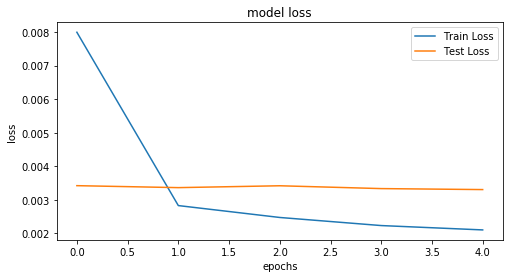

In [130]:

plt.figure(figsize=(8,4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()


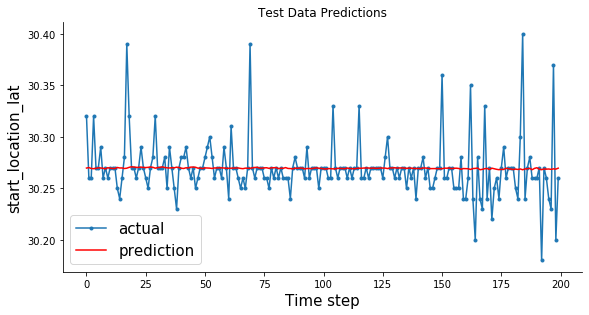

In [131]:
aa=[x for x in range(200)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test[0][:200], marker='.', label="actual")
plt.plot(aa, test_predict[:,0][:200], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.ylabel('start_location_lat', size=15)
plt.xlabel('Time step', size=15)
plt.legend(loc='best',fontsize=15)
plt.title('Test Data Predictions')
plt.show()

In [132]:
dataset = dataset_2['start_location_long'].values #numpy.ndarray
dataset = dataset.astype('float32')
dataset = np.reshape(dataset, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
train_size = int(len(dataset) * 0.80)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

def create_dataset(dataset, look_back=10):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)
    
look_back = 30
X_train, Y_train = create_dataset(train, look_back)
X_test, Y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
dataset_2['start_location_lat'].shape

(10009,)

In [133]:
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(30))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(X_train, Y_train, epochs=5, batch_size=20, validation_data=(X_test, Y_test), 
                    callbacks=[EarlyStopping(monitor='val_loss', patience=10)], verbose=1, shuffle=False)

model.summary()

Train on 7976 samples, validate on 1971 samples
Epoch 1/5
7976/7976 [==============================] - 5s 615us/step - loss: 0.0019 - val_loss: 0.0011
Epoch 2/5
7976/7976 [==============================] - 2s 288us/step - loss: 9.3561e-04 - val_loss: 0.0011
Epoch 3/5
7976/7976 [==============================] - 2s 297us/step - loss: 8.4317e-04 - val_loss: 0.0011
Epoch 4/5
7976/7976 [==============================] - 2s 298us/step - loss: 7.8789e-04 - val_loss: 0.0011
Epoch 5/5
7976/7976 [==============================] - 2s 261us/step - loss: 7.7029e-04 - val_loss: 0.0011
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_5 (LSTM)                (None, 1, 50)             16200     
_________________________________________________________________
dropout_5 (Dropout)          (None, 1, 50)             0         
_________________________________________________________________
lst

In [134]:
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)
# invert predictions
train_predict = scaler.inverse_transform(train_predict)
Y_train = scaler.inverse_transform([Y_train])
test_predict = scaler.inverse_transform(test_predict)
Y_test = scaler.inverse_transform([Y_test])
print('Train Mean Absolute Error:', mean_absolute_error(Y_train[0], train_predict[:,0]))
print('Train Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_train[0], train_predict[:,0])))
print('Test Mean Absolute Error:', mean_absolute_error(Y_test[0], test_predict[:,0]))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test[0], test_predict[:,0])))



Train Mean Absolute Error: 0.015821386361414176
Train Root Mean Squared Error: 0.023392805175464104
Test Mean Absolute Error: 0.019564179491116853
Test Root Mean Squared Error: 0.02833875178661489


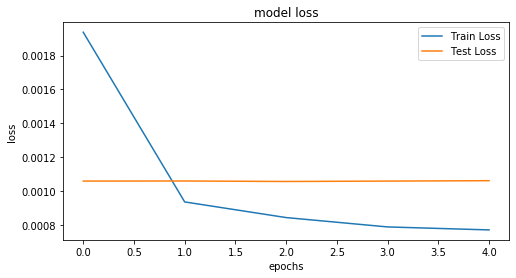

In [135]:

plt.figure(figsize=(8,4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()


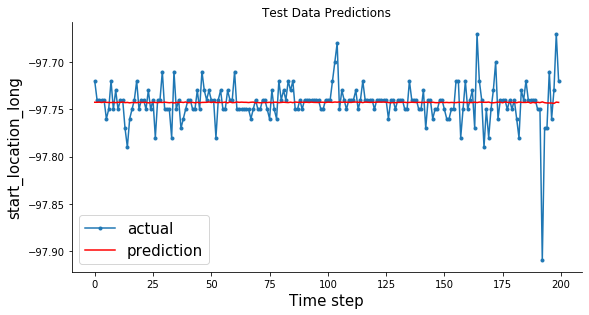

In [136]:
aa=[x for x in range(200)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test[0][:200], marker='.', label="actual")
plt.plot(aa, test_predict[:,0][:200], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.ylabel('start_location_long', size=15)
plt.xlabel('Time step', size=15)
plt.legend(loc='best',fontsize=15)
plt.title('Test Data Predictions')
plt.show()

In [243]:
cols=['distance_travelled','end_location_lat','end_location_long','start_location_long','start_location_lat']

In [234]:
print(dataset_2.head())
data_raw = dataset_2.values.astype("float32")
#data_raw=data_raw.reshape(-1,1)

                     distance_travelled  end_location_lat  end_location_long  \
completed_on                                                                   
2015-01-01 00:00:00               285.0             30.27             -97.75   
2015-01-01 01:00:00              1029.0             30.27             -97.74   
2015-01-01 02:00:00              8459.0             38.68            -121.04   
2015-01-01 03:00:00               443.0             38.68            -121.04   
2015-01-01 04:00:00               568.0             38.68            -121.04   

                     start_location_long  start_location_lat  
completed_on                                                  
2015-01-01 00:00:00               -97.75               30.27  
2015-01-01 01:00:00               -97.75               30.27  
2015-01-01 02:00:00               -97.05               30.65  
2015-01-01 03:00:00               -97.04               30.68  
2015-01-01 04:00:00               -97.04               30.20 

In [235]:
scaler = MinMaxScaler(feature_range = (0, 1))
data_raw = scaler.fit_transform(data_raw)

In [236]:
data_raw

array([[0.00252977, 0.02565372, 0.16524768, 0.18390656, 0.36922836],
       [0.00925173, 0.02565372, 0.16531861, 0.18390656, 0.36922836],
       [0.07638099, 0.4405526 , 0.        , 0.9885025 , 0.953846  ],
       ...,
       [0.09220108, 0.02664042, 0.16524768, 0.21839142, 0.32307434],
       [0.06169025, 0.02565372, 0.16531861, 0.19540405, 0.43076706],
       [0.23042591, 0.03305376, 0.16496384, 0.19540405, 0.36922836]],
      dtype=float32)

In [237]:
dataset_3=pd.DataFrame(data_raw)

In [240]:
dataset_3.index=dataset_2.index
np.dtype(dataset_3.index)

dtype('<M8[ns]')

In [251]:
dataset_3.columns=cols
dataset_3.head()

,distance_travelled,end_location_lat,end_location_long,start_location_long,start_location_lat
completed_on,,,,,
2015-01-01 00:00:00,0.002530,0.025654,0.165248,0.183907,0.369228
2015-01-01 01:00:00,0.009252,0.025654,0.165319,0.183907,0.369228
2015-01-01 02:00:00,0.076381,0.440553,0.000000,0.988503,0.953846
2015-01-01 03:00:00,0.003957,0.440553,0.000000,1.000000,1.000000
2015-01-01 04:00:00,0.005087,0.440553,0.000000,1.000000,0.261539


In [257]:
dataset = dataset_2['distance_travelled'].values #numpy.ndarray
dataset = dataset.astype('float32')
dataset = np.reshape(dataset, (-1, 1))
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
train_size = int(len(dataset) * 0.80)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]

def create_dataset(dataset, look_back=10):
    X, Y = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        X.append(a)
        Y.append(dataset[i + look_back, 0])
    return np.array(X), np.array(Y)
    
look_back = 30
X_train, Y_train = create_dataset(train, look_back)
X_test, Y_test = create_dataset(test, look_back)

# reshape input to be [samples, time steps, features]
X_train = np.reshape(X_train, (X_train.shape[0], 1, X_train.shape[1]))
X_test = np.reshape(X_test, (X_test.shape[0], 1, X_test.shape[1]))
dataset_2['distance_travelled'].shape

(10009,)

In [258]:
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(30))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

history = model.fit(X_train, Y_train, epochs=5, batch_size=200, validation_data=(X_test, Y_test), 
                    callbacks=[EarlyStopping(monitor='val_loss', patience=10)], verbose=1, shuffle=False)

model.summary()

Train on 7976 samples, validate on 1971 samples
Epoch 1/5
7976/7976 [==============================] - 5s 580us/step - loss: 0.0039 - val_loss: 0.0051
Epoch 2/5
7976/7976 [==============================] - 0s 55us/step - loss: 0.0035 - val_loss: 0.0050
Epoch 3/5
7976/7976 [==============================] - 0s 59us/step - loss: 0.0035 - val_loss: 0.0050
Epoch 4/5
7976/7976 [==============================] - 1s 63us/step - loss: 0.0035 - val_loss: 0.0050
Epoch 5/5
7976/7976 [==============================] - ETA: 0s - loss: 0.003 - 0s 50us/step - loss: 0.0035 - val_loss: 0.0050
Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_55 (LSTM)               (None, 1, 50)             16200     
_________________________________________________________________
dropout_55 (Dropout)         (None, 1, 50)             0         
________________________________________________________________

In [259]:
train_predict = model.predict(X_train)
test_predict = model.predict(X_test)
# invert predictions
train_predict = scaler.inverse_transform(train_predict)
Y_train = scaler.inverse_transform([Y_train])
test_predict = scaler.inverse_transform(test_predict)
Y_test = scaler.inverse_transform([Y_test])
print('Train Mean Absolute Error:', mean_absolute_error(Y_train[0], train_predict[:,0]))
print('Train Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_train[0], train_predict[:,0])))
print('Test Mean Absolute Error:', mean_absolute_error(Y_test[0], test_predict[:,0]))
print('Test Root Mean Squared Error:',np.sqrt(mean_squared_error(Y_test[0], test_predict[:,0])))



Train Mean Absolute Error: 4451.053527037205
Train Root Mean Squared Error: 6492.895634304348
Test Mean Absolute Error: 5345.004919029661
Test Root Mean Squared Error: 7833.137545594595


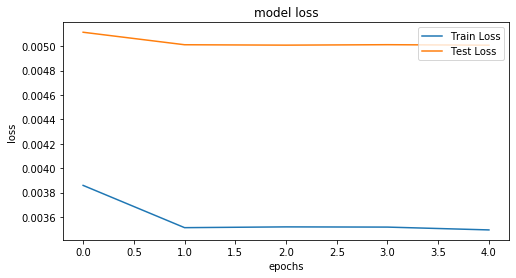

In [260]:

plt.figure(figsize=(8,4))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Test Loss')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epochs')
plt.legend(loc='upper right')
plt.show()


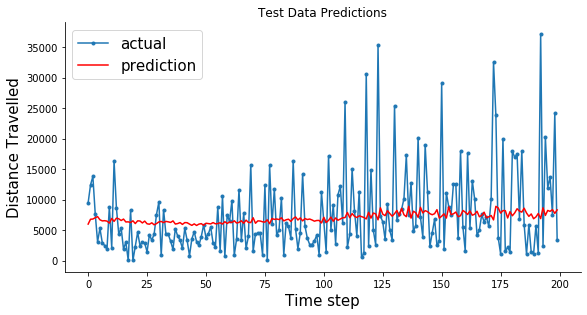

In [261]:
aa=[x for x in range(200)]
plt.figure(figsize=(8,4))
plt.plot(aa, Y_test[0][:200], marker='.', label="actual")
plt.plot(aa, test_predict[:,0][:200], 'r', label="prediction")
# plt.tick_params(left=False, labelleft=True) #remove ticks
plt.tight_layout()
sns.despine(top=True)
plt.ylabel('Distance Travelled', size=15)
plt.xlabel('Time step', size=15)
plt.legend(loc='best',fontsize=15)
plt.title('Test Data Predictions')
plt.show()

In [ ]:
# clearly for the first dataset both Sarima and LSTM methods did pretty well 
# but for the second dataset for all the three parameters the LSTM model failed miserably whereas the SARIMA model did pretty well

In [263]:
import geopandas as gpd
from shapely.geometry import Point,Polygon

In [265]:
import mplleaflet
import descartes

In [277]:
c=['start_location_lat','start_location_long']
points=dataset_2[c]

In [278]:
type(points)

pandas.core.frame.DataFrame

In [282]:
gdf = gpd.GeoDataFrame(
    points, geometry=gpd.points_from_xy(points.start_location_long, points.start_location_lat))

In [285]:
gdf=gdf[1:100 :]

In [293]:
gdf.plot()
mplleaflet.show()

In [294]:
ax = gdf.plot(markersize = 50, color = "red")

# 2. Convert plot to a web map:
mplleaflet.display(fig=ax.figure, crs=gdf.crs)

In [292]:
import folium

In [295]:
m = folium.Map(location=[30.25, -97.75], zoom_start=10, control_scale=True)

In [296]:
m

In [297]:
m2 = folium.Map(location=[30.25, -97.75], tiles='Stamen Toner',
                zoom_start=12, control_scale=True, prefer_canvas=True)

m2

In [301]:
folium.Marker(
    location=[30.25435, -97.75543],
    popup=[30.25435, -97.75543],
    icon=folium.Icon(color='green', icon='ok-sign'),
).add_to(m)

#Show map
m

In [307]:
# Get x and y coordinates for each point
gdf["x"] = gdf["geometry"].apply(lambda geom: geom.x)
gdf["y"] = gdf["geometry"].apply(lambda geom: geom.y)

# Create a list of coordinate pairs
locations = list(zip(gdf["y"], gdf["x"]))

In [308]:
len(locations)

99

In [311]:
from folium.plugins import HeatMap

# Create a Map instance
m = folium.Map(location=[30.25, -97.75], tiles = 'stamentoner', zoom_start=10, control_scale=True)

# Add heatmap to map instance
# Available parameters: HeatMap(data, name=None, min_opacity=0.5, max_zoom=18, max_val=1.0, radius=25, blur=15, gradient=None, overlay=True, control=True, show=True)
HeatMap(locations).add_to(m)

# Alternative syntax:
#m.add_child(HeatMap(points_array, radius=15))

# Show map
m

In [312]:
from folium.plugins import MarkerCluster

In [313]:
marker_cluster = MarkerCluster(locations)

# Add marker cluster to map
marker_cluster.add_to(m)

# Show map
m